# Visualize and Evaluate model

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
%matplotlib inline
import argparse
import os
from os.path import isfile,join
import random
import torch
import torch.nn as nn
import torchvision
from torchvision import models
import torch.utils.data as tud
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.transforms.functional as TF
import torchvision.utils as vutils
from torch.utils.data import DataLoader, Dataset
from torch.utils.data.dataset import random_split
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from PIL import Image
from collections import Counter
from sklearn.metrics import jaccard_score
import pickle
import sys
sys.path.insert(1, '../utils')
sys.path.insert(1, '../datasets')
sys.path.insert(1, '../utils_on_gpu')
import coco_utils as cu
import my_datasets as mdset
import eval_train as ev
import utils as U
import find_best_model as fbm   




## Parameters

In [5]:
# DATASETS
dataroot_voc = '~/data/voc2012'
dataroot_sbd = '~/data/sbd'
dataroot_coco = '/share/DEEPLEARNING/datasets/coco'
dataroot_landcover = '/users/k/karmimy/data/landcover'
dataroot_coco2voc = '/users/k/karmimy/data/coco2voc'
VOC = False

nw = 4 
pm = True
#MODEL SAVE AND LOAD 
load_dir = '/share/homes/karmimy/equiv/save_model' # Saved model dir
exp = 'rot_equiv_lc'
model_name = 'rot_equiv_lc.pt'
folder_model = join(load_dir,exp) 
#fcn= True
#pretrained=True

# GPU 
gpu = 1
# EVAL PARAMETERS
bs = 2  

# LOSS 
criterion_supervised = nn.CrossEntropyLoss(ignore_index=21) # On ignore la classe border.
Loss = 'KL' # Loss = 'KL' or 'CE' or None for L1,MSE…
criterion_unsupervised = U.get_criterion(Loss)


# SEARCH FOR A PARTICULAR MODEL 
rotate = False # random rotation during training
scale = True
split = True # split the supervised dataset
ratio = 0.3
batch_size = 4

#scale_factor = (0.2,0.8)
#size_img = (420,420) 
#size_crop = (380,380)

# DEVICE
# Decide which device we want to run on
device = torch.device("cuda:"+str(gpu) if torch.cuda.is_available() else "cpu")
print("device :",device)

device : cuda:1


In [6]:
model_dir,_ = fbm.find_best_model_(folder=folder_model,split=split,batch_size=batch_size,rotate=False)

search in /share/homes/karmimy/equiv/save_model/rot_equiv_lc/0
search in /share/homes/karmimy/equiv/save_model/rot_equiv_lc/1
No iou found in: /share/homes/karmimy/equiv/save_model/rot_equiv_lc/1/iou_test.npy
search in /share/homes/karmimy/equiv/save_model/rot_equiv_lc/2
No iou found in: /share/homes/karmimy/equiv/save_model/rot_equiv_lc/2/iou_test.npy
search in /share/homes/karmimy/equiv/save_model/rot_equiv_lc/3
No iou found in: /share/homes/karmimy/equiv/save_model/rot_equiv_lc/3/iou_test.npy
search in /share/homes/karmimy/equiv/save_model/rot_equiv_lc/4
No iou found in: /share/homes/karmimy/equiv/save_model/rot_equiv_lc/4/iou_test.npy
search in /share/homes/karmimy/equiv/save_model/rot_equiv_lc/5
search in /share/homes/karmimy/equiv/save_model/rot_equiv_lc/6
search in /share/homes/karmimy/equiv/save_model/rot_equiv_lc/7
search in /share/homes/karmimy/equiv/save_model/rot_equiv_lc/8
search in /share/homes/karmimy/equiv/save_model/rot_equiv_lc/9
No iou found in: /share/homes/karmimy/

In [5]:
model = torch.load(join(model_dir,model_name))
model.to(device)

)
    )
    (layer2): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(256, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(128, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
          (0): Conv2d(256, 512, kernel_size=(1, 1), stride=(2, 2), bias=False)
          (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
      )
      (1): Bottleneck(
        (conv1): Conv2d(512, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(128

## DATASETS

In [6]:
if VOC : 
        train_dataset_VOC = mdset.VOCSegmentation(dataroot_voc,year='2012', image_set='train', \
                download=True,rotate=rotate,scale=scale,size_img=size_img,size_crop=size_crop)
        test_dataset = mdset.VOCSegmentation(dataroot_voc,year='2012', image_set='val', download=True)
        train_dataset_SBD = mdset.SBDataset(dataroot_sbd, image_set='train_noval',mode='segmentation',\
                rotate=rotate,scale=scale,size_img=size_img,size_crop=size_crop)
        train_dataset = tud.ConcatDataset([train_dataset_VOC,train_dataset_SBD])
else:
        print('Loading Landscape Dataset')
        train_dataset = mdset.LandscapeDataset(dataroot_landcover,image_set="trainval",\
            rotate=rotate)#,size_img=size_img,size_crop=size_crop)
        test_dataset = mdset.LandscapeDataset(dataroot_landcover,image_set="test")
        test_dataset_no_norm =  mdset.LandscapeDataset(dataroot_landcover,image_set="test",normalize=False)
        print('Success load Landscape Dataset')
dataloader_train = torch.utils.data.DataLoader(train_dataset, batch_size=bs,num_workers=nw,\
        pin_memory=pm,shuffle=True,drop_last=True)#,collate_fn=U.my_collate)
dataloader_val = torch.utils.data.DataLoader(test_dataset,num_workers=nw,pin_memory=pm,\
        batch_size=bs)


Loading Landscape Dataset
Success load Landscape Dataset


## Plot Losses and Metrics 

In [7]:
def plot_loss_metrics(folder,model_name):
    l_npy = [f for f in os.listdir(folder) if isfile(join(folder,f)) and f.endswith(".npy")] # Load all numpy file in the best folder
    for f in l_npy:
        curv = np.load(join(model_dir,f))
        plt.figure(figsize=(10,8))
        plt.subplot(2,1,1)
        plt.title(model_name.upper())
        plt.plot(curv)
        plt.xlabel("iterations")
        plt.ylabel(f.upper())



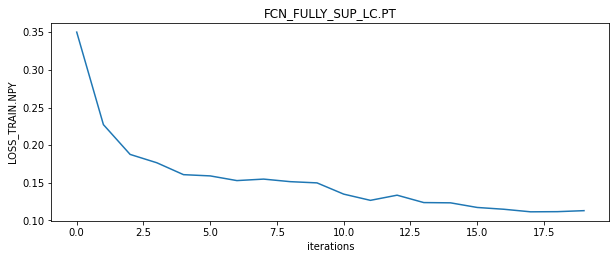

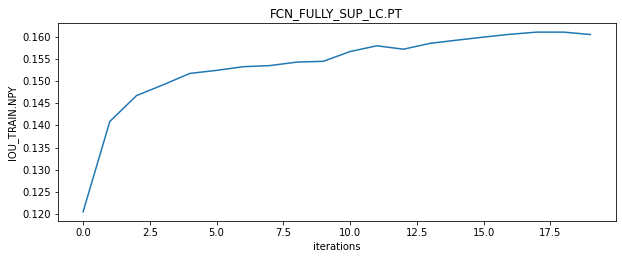

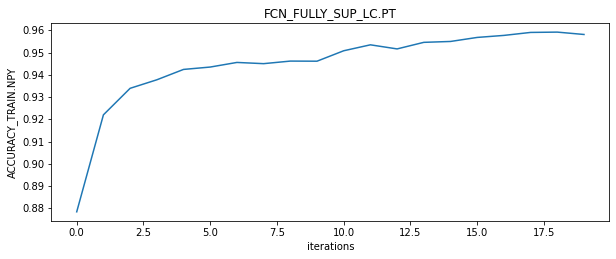

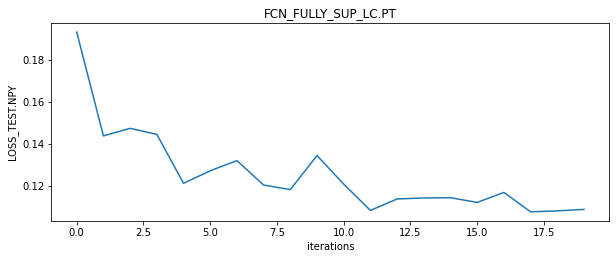

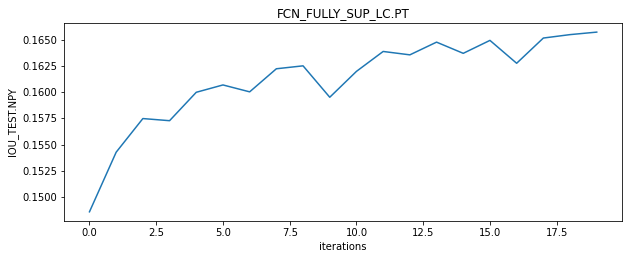

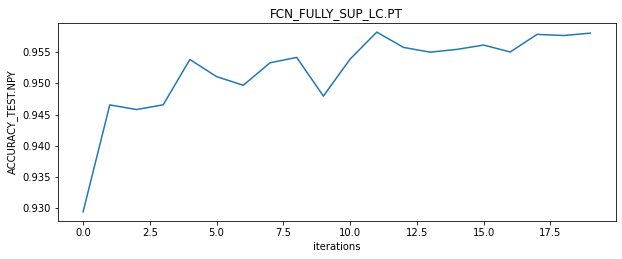

In [8]:
plot_loss_metrics(model_dir,model_name)

## SHOW MODEL PREDICTIONS

In [15]:
# PARAMETERS FOR THE VISUALIZATION 
NUMBER_EXAMPLES = 20
list_iter = np.random.randint(0,len(test_dataset),NUMBER_EXAMPLES) # TAKE N RANDOM IMAGES 
CLASS = U.LANDCOVER_CLASS
CMAP = U.get_cmap_landcover()

[autoreload of utils failed: Traceback (most recent call last):
  File "/users/k/karmimy/.local/lib/python3.6/site-packages/IPython/extensions/autoreload.py", line 245, in check
    superreload(m, reload, self.old_objects)
  File "/users/k/karmimy/.local/lib/python3.6/site-packages/IPython/extensions/autoreload.py", line 410, in superreload
    update_generic(old_obj, new_obj)
  File "/users/k/karmimy/.local/lib/python3.6/site-packages/IPython/extensions/autoreload.py", line 347, in update_generic
    update(a, b)
  File "/users/k/karmimy/.local/lib/python3.6/site-packages/IPython/extensions/autoreload.py", line 302, in update_class
    if update_generic(old_obj, new_obj): continue
  File "/users/k/karmimy/.local/lib/python3.6/site-packages/IPython/extensions/autoreload.py", line 347, in update_generic
    update(a, b)
  File "/users/k/karmimy/.local/lib/python3.6/site-packages/IPython/extensions/autoreload.py", line 302, in update_class
    if update_generic(old_obj, new_obj): continu

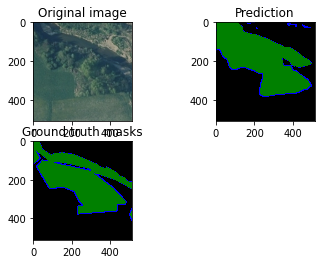

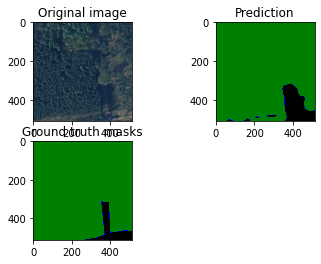

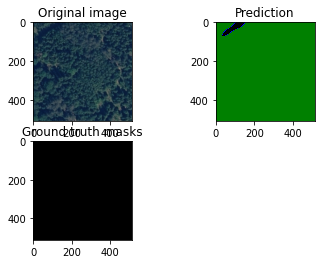

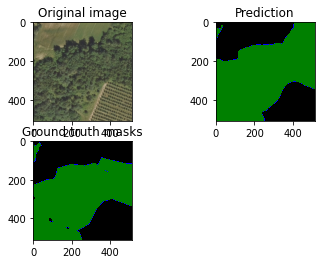

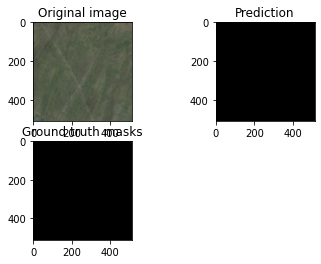

...

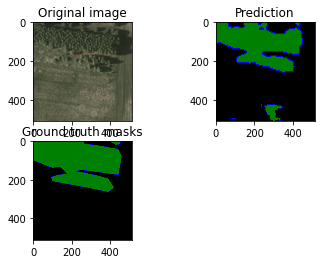

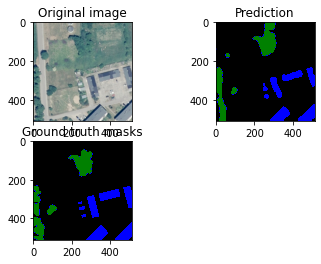

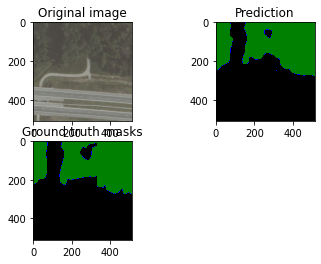

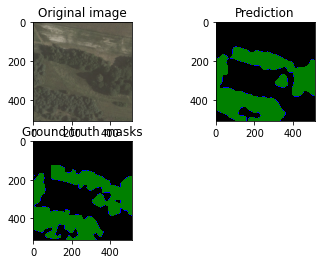

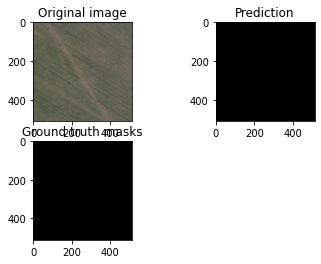

In [17]:
l_iou=[]
l_acc=[]
for i,im in enumerate(list_iter):
    print('ITERATION',i,'/',NUMBER_EXAMPLES)
    x,gt = test_dataset.__getitem__(im)
    im,_ = test_dataset_no_norm.__getitem__(im)
    x = x.unsqueeze(0).to(device)
    pred = model(x)
    pred = pred['out']

    #plot
    im = torch.transpose(im,0,2)
    im = torch.transpose(im,0,1)
    pred = pred.argmax(dim=1).squeeze().cpu()
    fig = plt.figure()
    ax1 = fig.add_subplot(2,2,1)
    ax1.title.set_text('Original image')
    ax1.imshow(im.cpu(),cmap=CMAP)
    ax2 = fig.add_subplot(2,2,2)
    ax2.title.set_text('Prediction')
    ax2.imshow(pred,cmap=CMAP)
    ax3 = fig.add_subplot(2,2,3)
    ax3.title.set_text('Ground truth masks')
    ax3.imshow(gt.cpu(),cmap=CMAP)
    
    # Metrics 
    iou = U.inter_over_union(pred,gt)
    acc = int(torch.sum(pred==gt)/(pred.size()[0]*pred.size()[1]))
    l_iou.append(iou)
    l_acc.append(acc)
    print("Metrics on this example... IoU:",iou,"Accuracy",acc)
print("Mean IoU",np.array(l_iou).mean(),"Mean Accuracy",np.array(l_acc).mean())